#### reference
opencv tutorial code : https://docs.opencv.org/3.4.3/dc/dc3/tutorial_py_matcher.html </br>
Type error: required argument 'outlmg' (pos6) not found : https://stackoverflow.com/questions/31631352/typeerror-required-argument-outimg-pos-6-not-found </br>
cv2.SIFT error : https://stackoverflow.com/questions/18561910/cant-use-surf-sift-in-opencv 


# Feature matching
그림 비교 및 유사도 측정 </br>
유사도(Match Score) = (유사한 특징임을 설명해주는 feature spot 수 / 추출한 feature의 수) *100

In [7]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import os




### Brute-Force Matching with SIFT Descriptors and Ratio Test

In [8]:
def fm_SIFT(img1,img2):    
    # Initiate SIFT detector
    # SIFT detector code changed cv.SIFT() got error 
    original = cv.imread(img1,0)
    compare = cv.imread(img2,0)
    
    sift = cv.xfeatures2d.SIFT_create()
    
    ### flip compare image  
    original = cv.flip(original,1)
    compare = cv.flip(compare,1) # 1: left/right, 2: up/down
     
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(original,None)
    kp2, des2 = sift.detectAndCompute(compare,None)

    # BFMatcher with default params
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1,des2, k=2)

    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append([m])
            
    # cv.drawMatchesKnn expects list of lists as matches.
    plt.figure(figsize=(18,20))
    plt.xticks([]),plt.yticks([])
    visual = cv.drawMatchesKnn(original,kp1,compare,kp2,good,None,flags=2)

    ## 추가         
    number_keypoints = 0
    if len(kp1) <= len(kp2):
        number_keypoints = len(kp1)
    else:
        number_keypoints = len(kp2)


    return ("Match Score: %s" 
            %(len(good)),
            plt.imshow(visual))      

('Match Score: 71', <matplotlib.image.AxesImage object at 0x000002AA87501588>)
('Match Score: 31', <matplotlib.image.AxesImage object at 0x000002AA875322B0>)
('Match Score: 20', <matplotlib.image.AxesImage object at 0x000002AA87553F98>)
('Match Score: 12', <matplotlib.image.AxesImage object at 0x000002AA87589CC0>)
('Match Score: 12', <matplotlib.image.AxesImage object at 0x000002AA875B89E8>)
('Match Score: 42', <matplotlib.image.AxesImage object at 0x000002AA875F9710>)
('Match Score: 29', <matplotlib.image.AxesImage object at 0x000002AA87625438>)
('Match Score: 43', <matplotlib.image.AxesImage object at 0x000002AA87D2C160>)
('Match Score: 24', <matplotlib.image.AxesImage object at 0x000002AA87D52E48>)


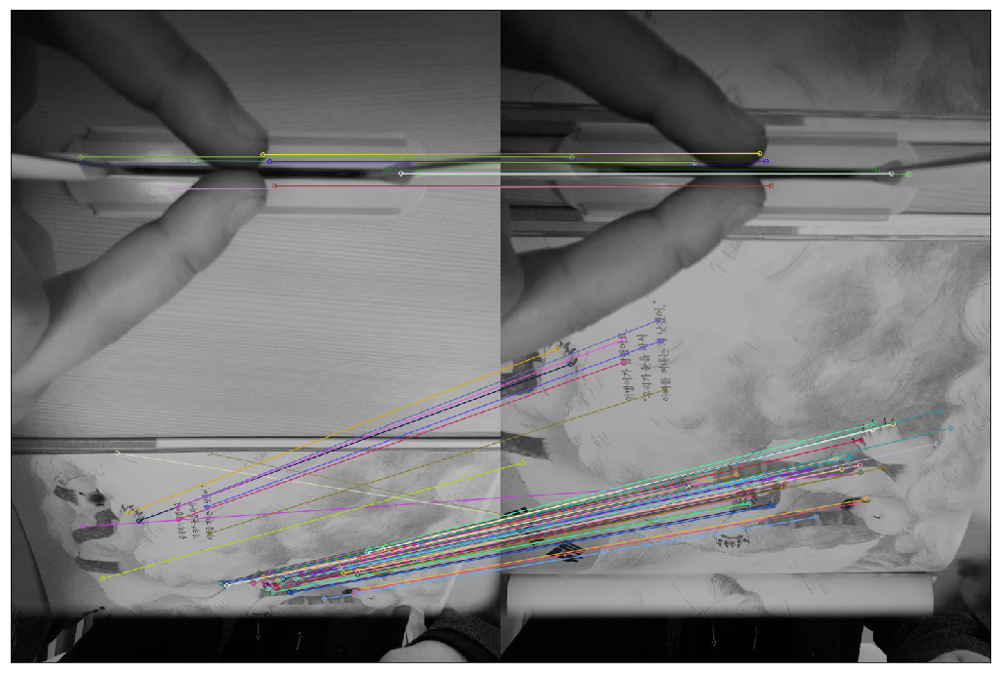

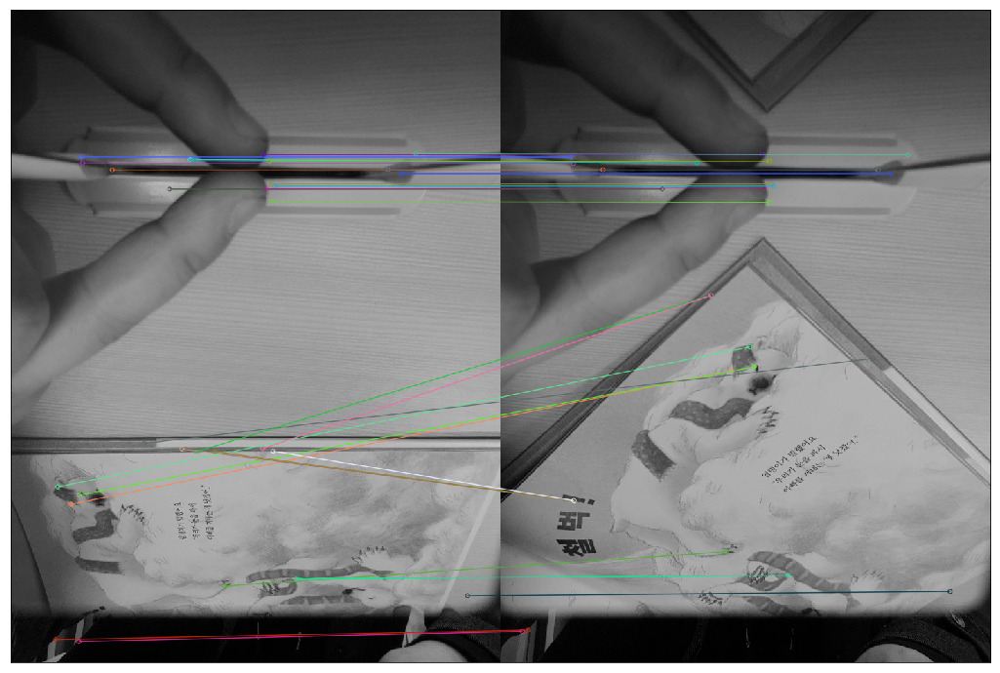

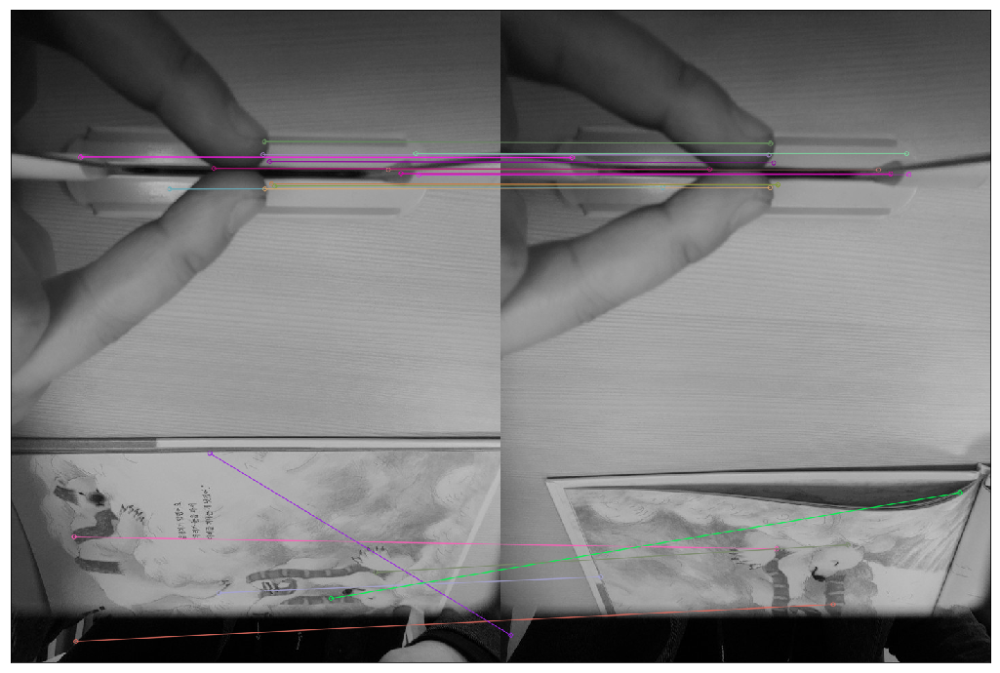

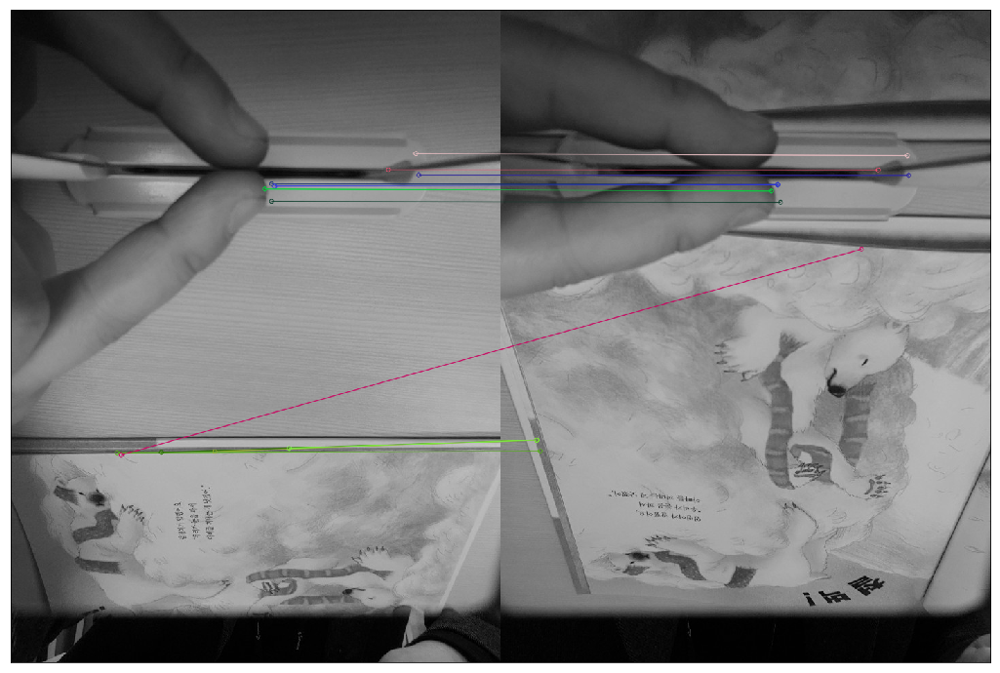

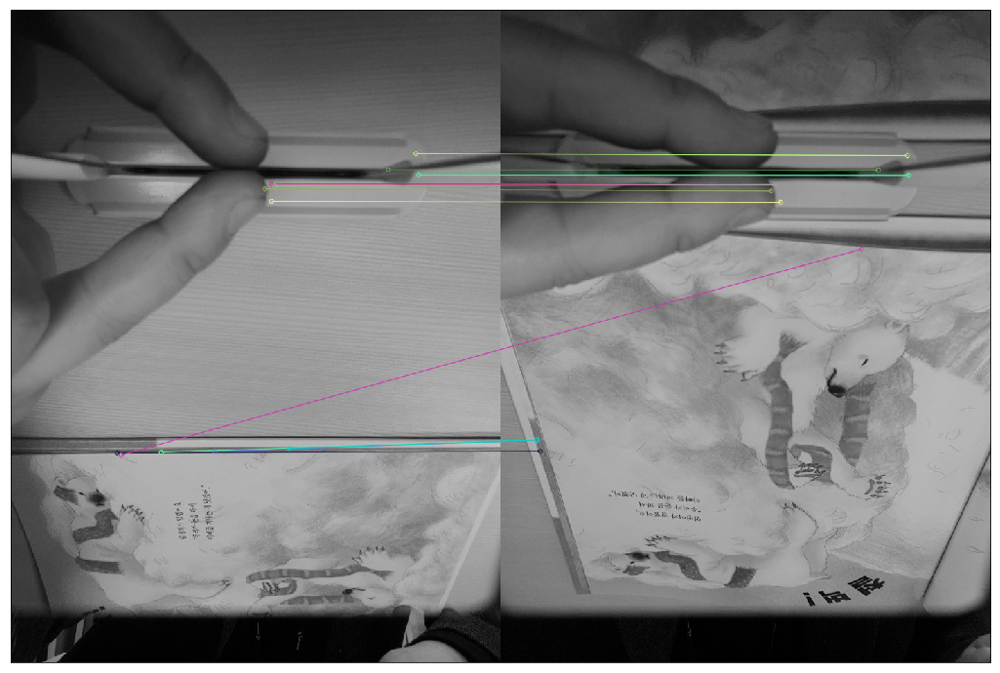

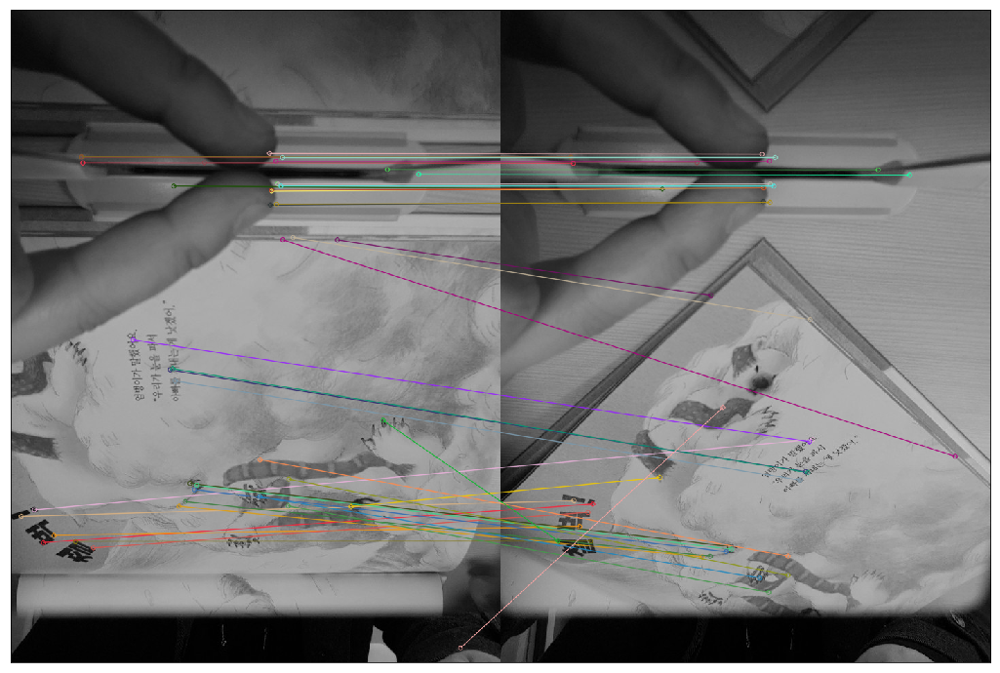

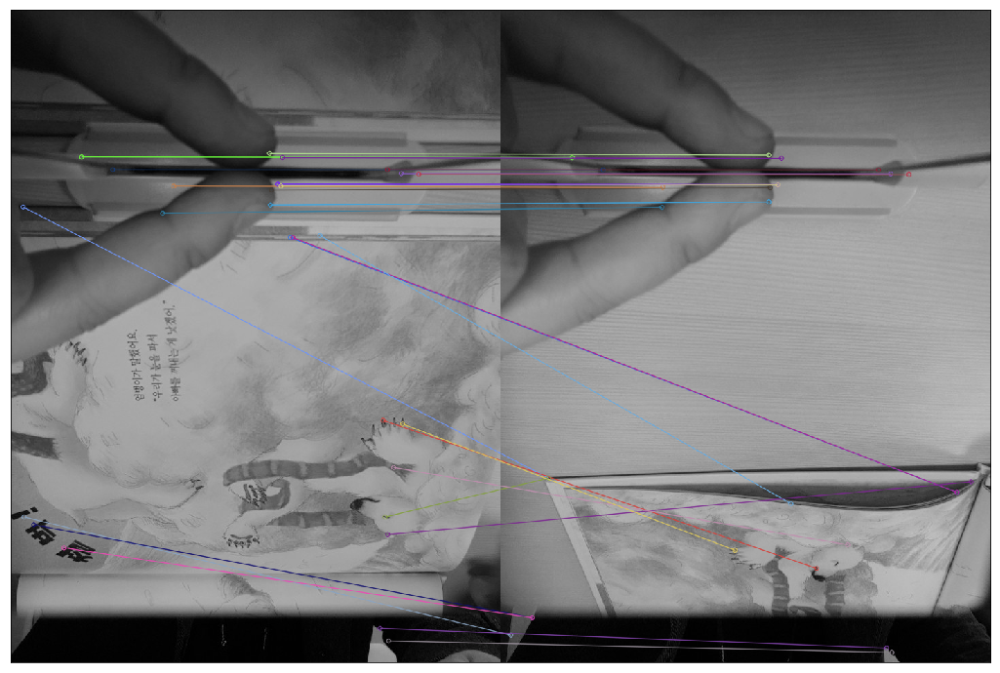

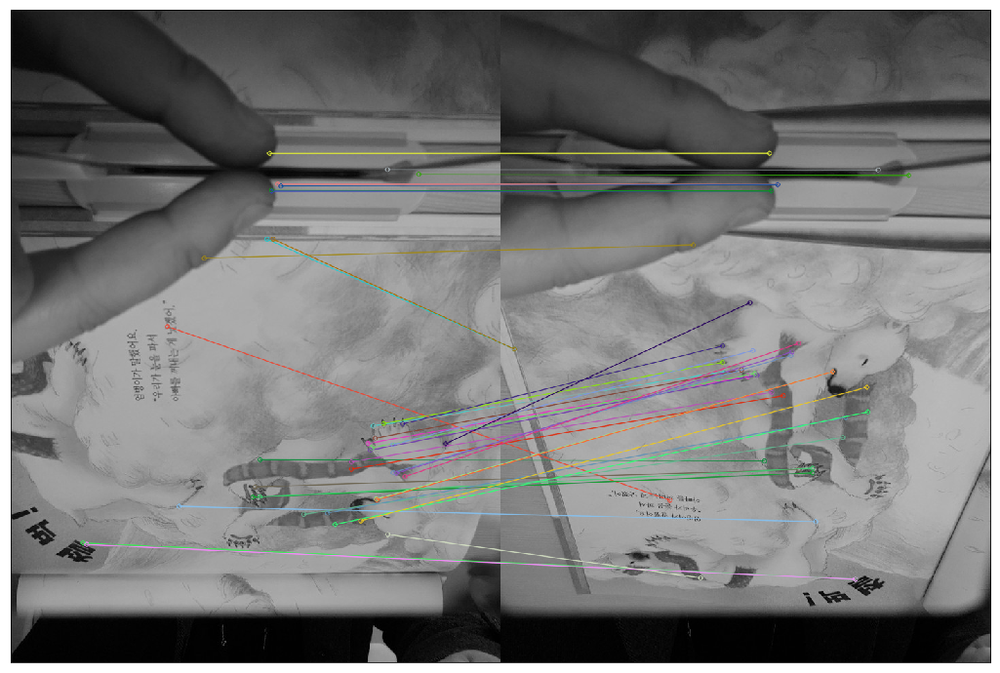

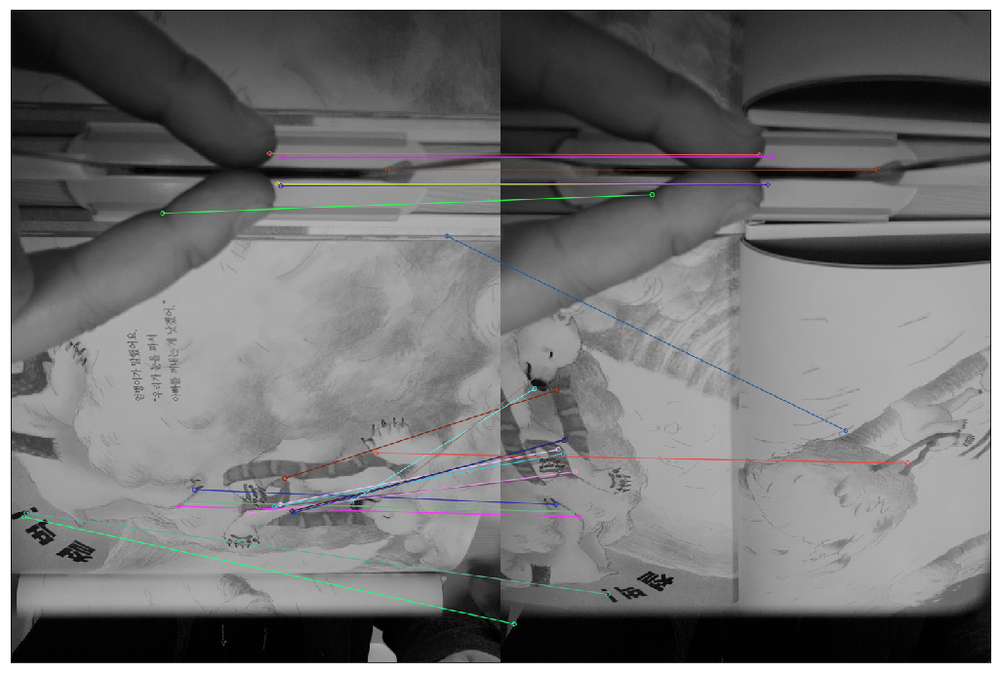

In [16]:
# with data 
path_dir = "..\\picture\\com_set2"
file_list = os.listdir(path_dir)

for i,j in enumerate(file_list):
#     if i >= len(file_list):
#         break
#     else: 
    print(fm_SIFT(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir+"\\"+j,path_dir+"\\"+file_list[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir+"\\"+j,path_dir+"\\"+file_list[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir+"\\"+j,path_dir+"\\"+file_list[i+4]))
    if i+5 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir+"\\"+j,path_dir+"\\"+file_list[i+4]))
    

('Match Score: 11', <matplotlib.image.AxesImage object at 0x000002AA87E34320>)
('Match Score: 13', <matplotlib.image.AxesImage object at 0x000002AA8856ACC0>)
('Match Score: 20', <matplotlib.image.AxesImage object at 0x000002AA8859E978>)
('Match Score: 27', <matplotlib.image.AxesImage object at 0x000002AA885CF6A0>)
('Match Score: 9', <matplotlib.image.AxesImage object at 0x000002AA8860E3C8>)
('Match Score: 24', <matplotlib.image.AxesImage object at 0x000002AA8863F0F0>)
('Match Score: 16', <matplotlib.image.AxesImage object at 0x000002AA89555DD8>)


IndexError: list index out of range

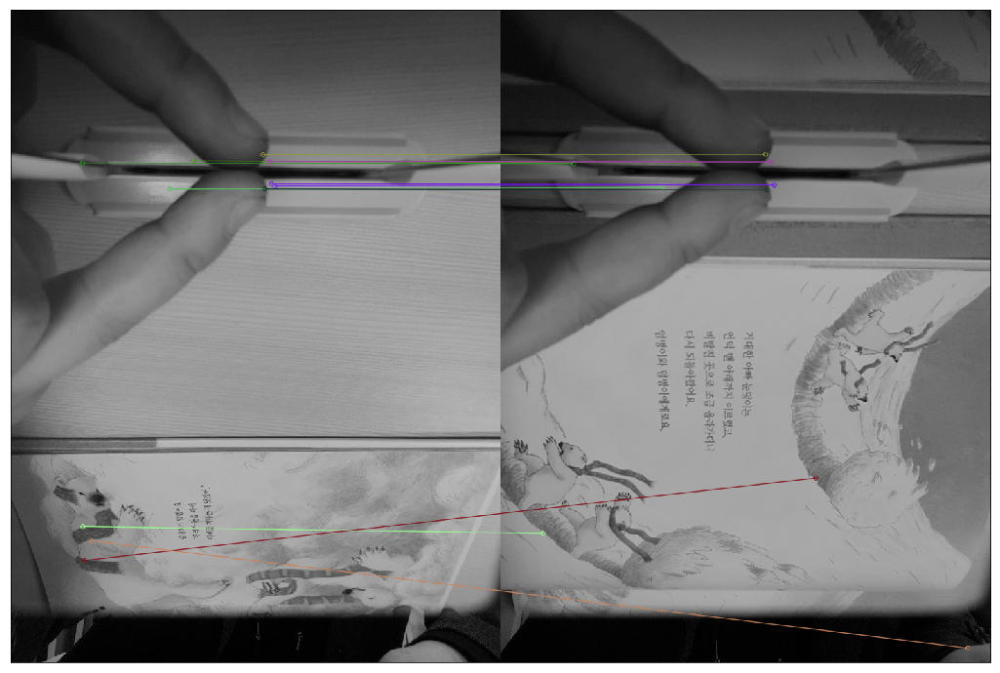

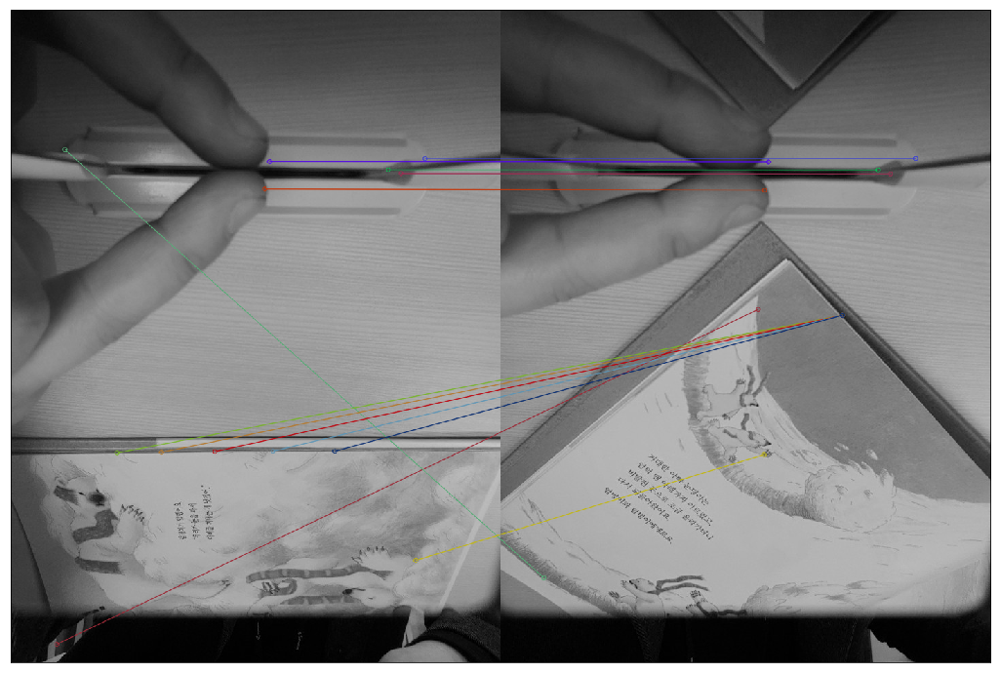

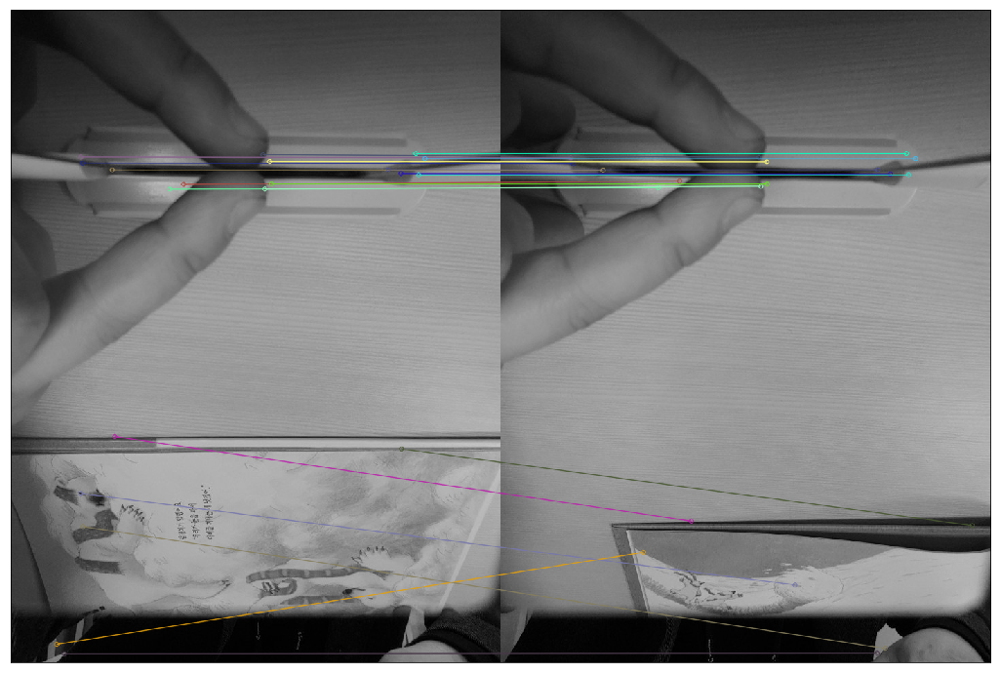

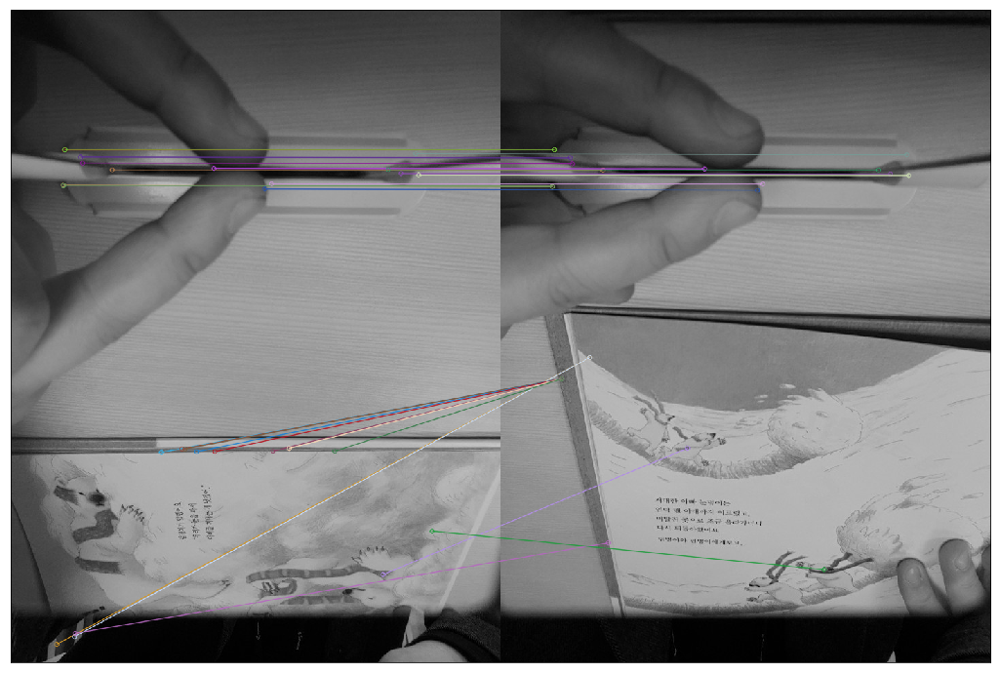

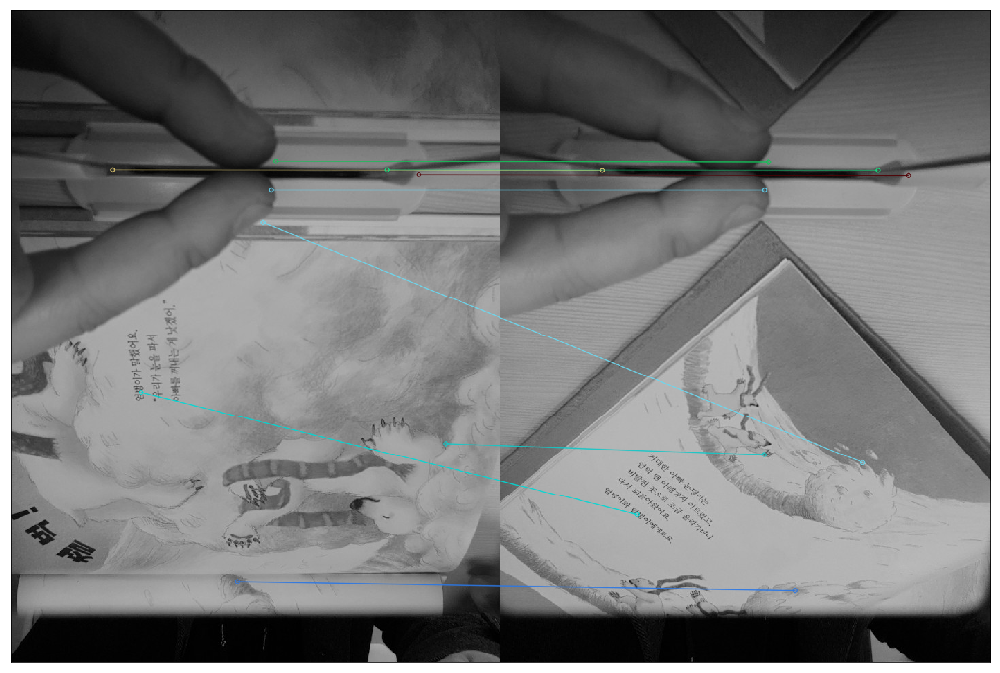

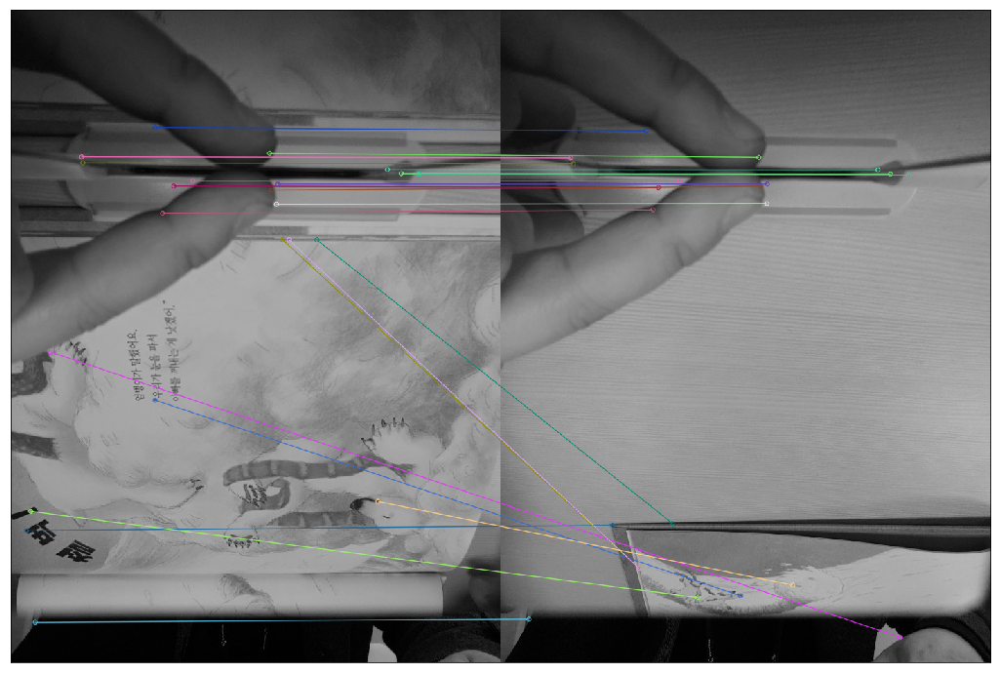

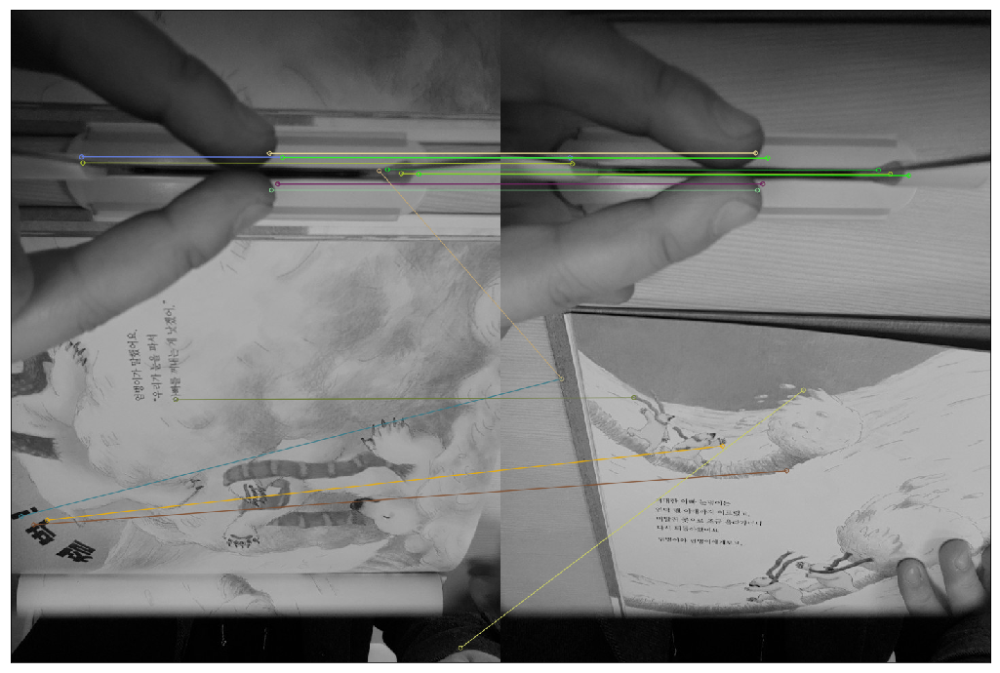

In [18]:
path_dir_1 = "..\\picture\\com_set2"
path_dir_2 = "..\\picture\\com_set3"
file_list_1 = os.listdir(path_dir_1)
file_list_2 = os.listdir(path_dir_2)

for i,j in enumerate(file_list_1):
    if i+1 >= len(file_list_1):
        break
    else: 
        print(fm_SIFT(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_SIFT(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+4]))



### FLANN based Matcher

In [5]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

In [6]:
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2

In [5]:
def fm_FLANN(img1,img2):
    original = cv.imread(img1,0)
    compare = cv.imread(img2,0)
    
    ### flip compare image
    original = cv.flip(original,1)
    compare = cv.flip(compare,1) # 1 : left/right, 0 : up/down
    
    # Initiate SIFT detector
    sift = cv.xfeatures2d.SIFT_create()

    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(original,None)
    kp2, des2 = sift.detectAndCompute(compare,None)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=100)   # or pass empty dictionary
    flann = cv.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2) # 2순위 매칭 결과까지 취함 
    
    # Need to draw only good matches, so create a mask
    matchesMask = [[0,0] for i in range(len(matches))]
    good = []
    
    ## 추가 
    number_keypoints = 0
    if len(kp1) <= len(kp2):
        number_keypoints = len(kp1)
    else :
        number_keypoints = len(kp2)

       
    # ratio test as per Lowe's paper
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.6*n.distance:
            matchesMask[i]=[1,0]
            good.append(m)
            
    draw_params = dict(matchColor = (0,255,0),
                       singlePointColor = (255,0,0),
                       matchesMask = matchesMask,
                       flags = 0)

    visual = cv.drawMatchesKnn(original,kp1,compare,kp2,matches,None,**draw_params)

    plt.figure(figsize=(18,20))
    plt.xticks([]),plt.yticks([])
    
    
#     return ("Keypoints 1ST Image: " + str(len(kp1)), 
#         "Keypoints 2ND Image: " + str(len(kp2)), 
#         "GOOD Matches:%s" %len(good), 
#         "Match Score: %s" %(len(good) / number_keypoints * 100),
#         plt.imshow(visual))   

    return(len(good), plt.imshow(visual))


(98, <matplotlib.image.AxesImage object at 0x000002AA865A26A0>)


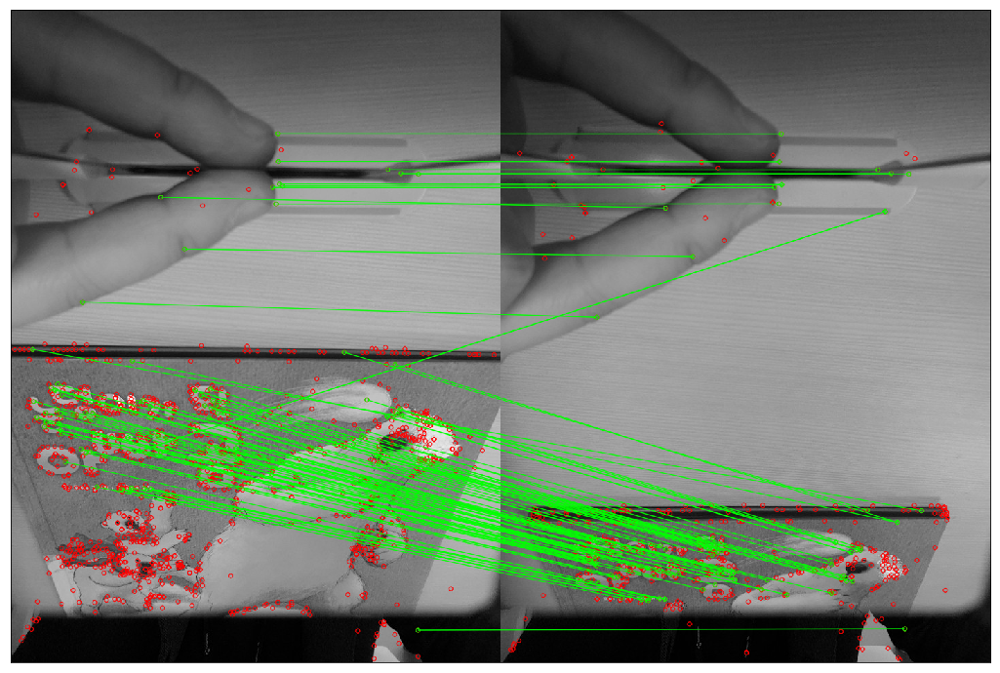

In [6]:
path_dir = "..\\picture\\com_set1"
file_list = os.listdir(path_dir)

for i,j in enumerate(file_list):
    if i+1 >= len(file_list):
        break
    else: 
        print(fm_FLANN(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir+"\\"+j,path_dir+"\\"+file_list[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir+"\\"+j,path_dir+"\\"+file_list[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir+"\\"+j,path_dir+"\\"+file_list[i+4]))
    

(9, <matplotlib.image.AxesImage object at 0x000002AA876085F8>)
(6, <matplotlib.image.AxesImage object at 0x000002AA87612AC8>)
(16, <matplotlib.image.AxesImage object at 0x000002AA87DA14A8>)
(19, <matplotlib.image.AxesImage object at 0x000002AA87DD30F0>)
(4, <matplotlib.image.AxesImage object at 0x000002AA87E11DD8>)
(16, <matplotlib.image.AxesImage object at 0x000002AA87E3DB00>)
(9, <matplotlib.image.AxesImage object at 0x000002AA8852E828>)


IndexError: list index out of range

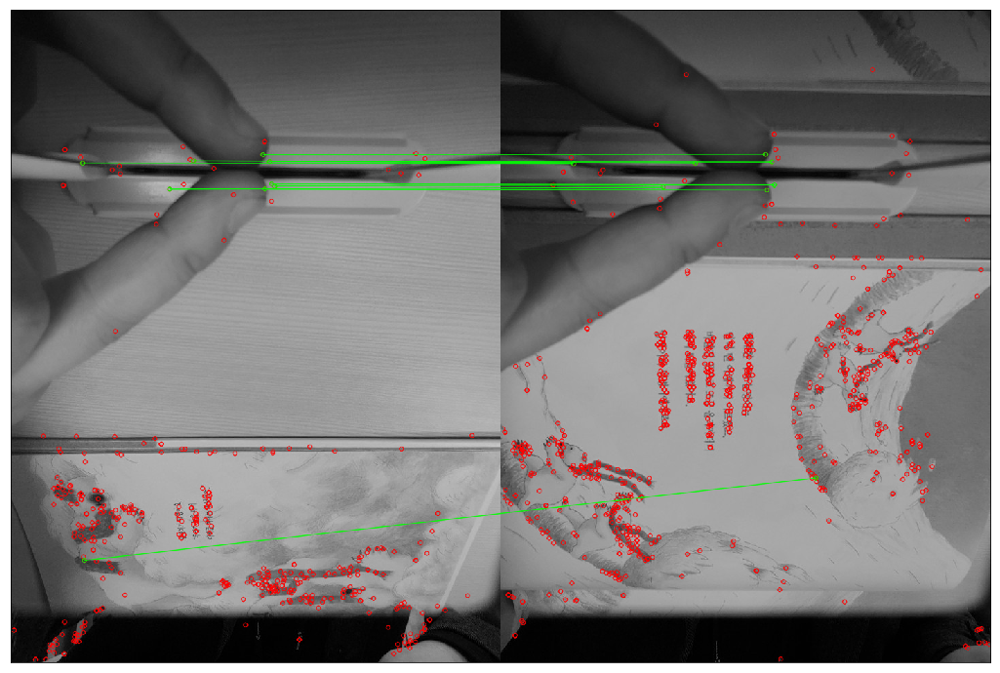

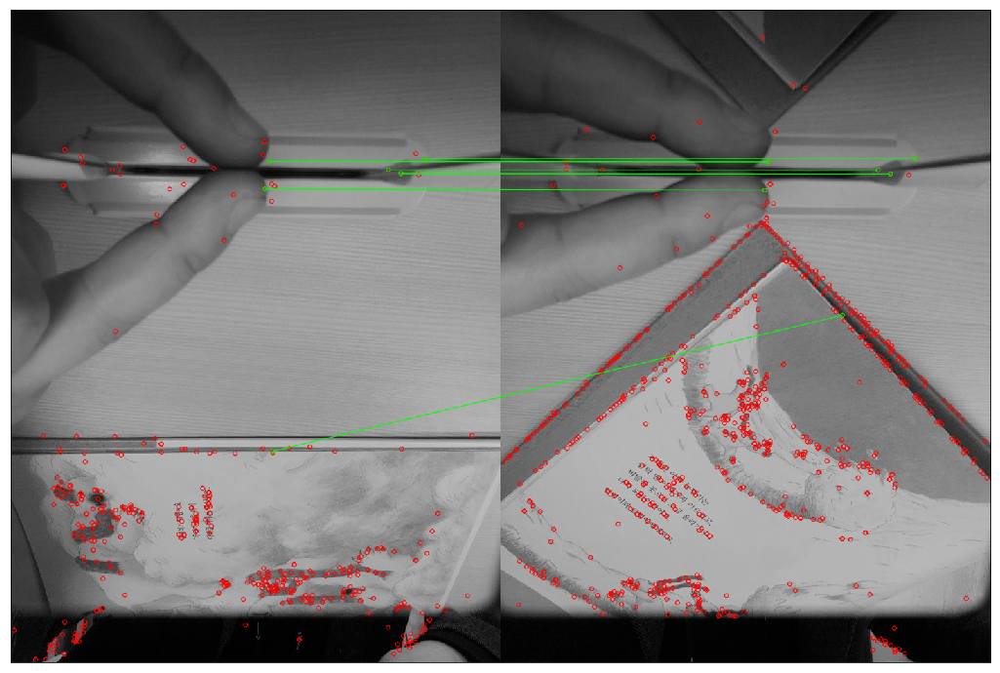

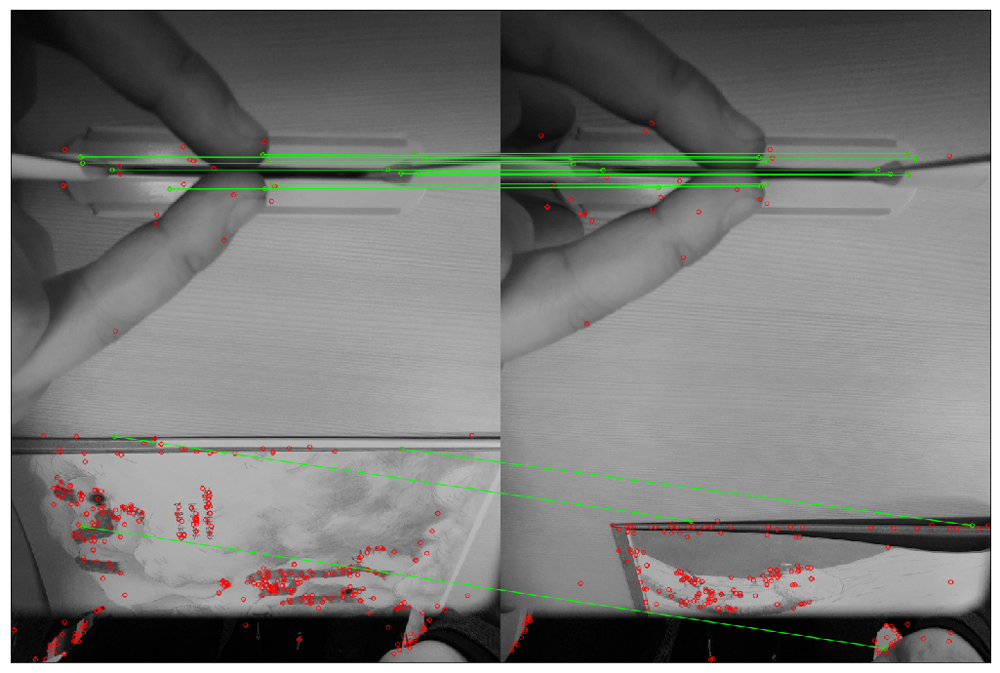

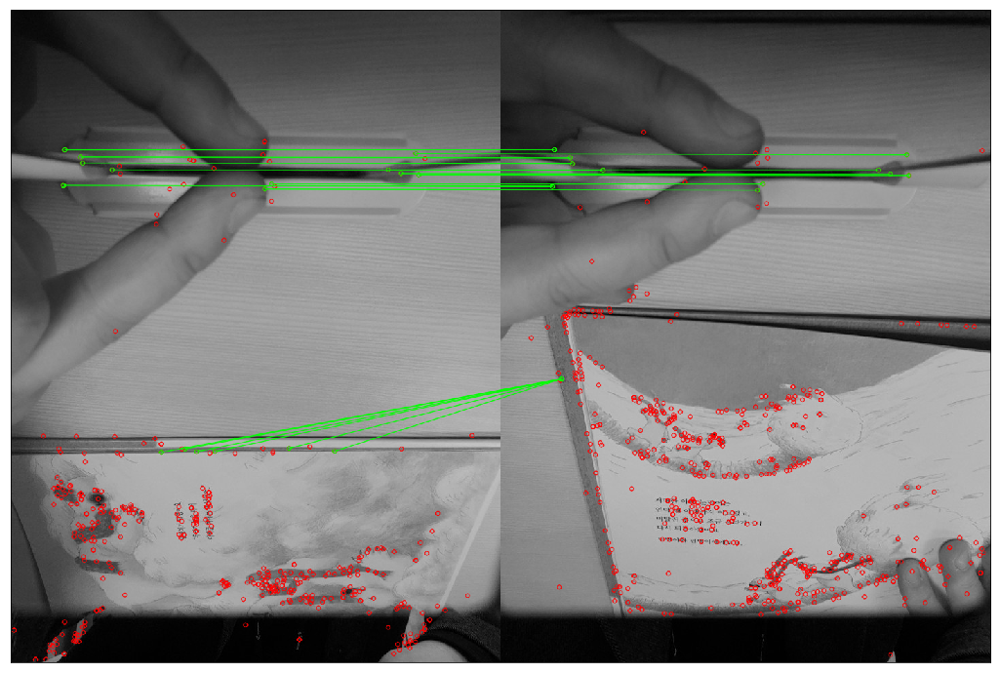

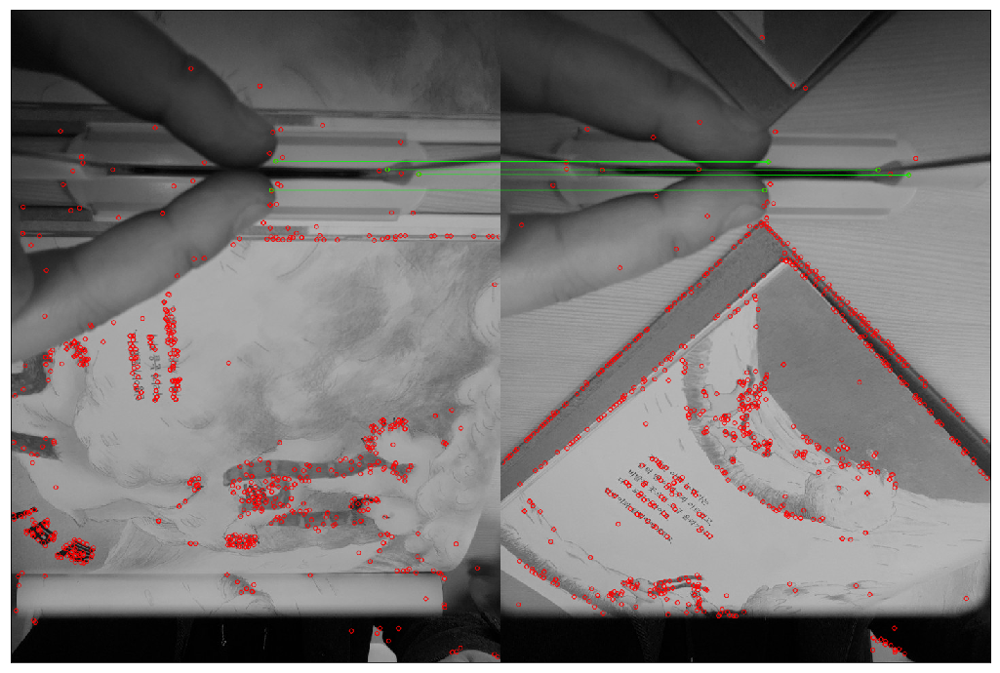

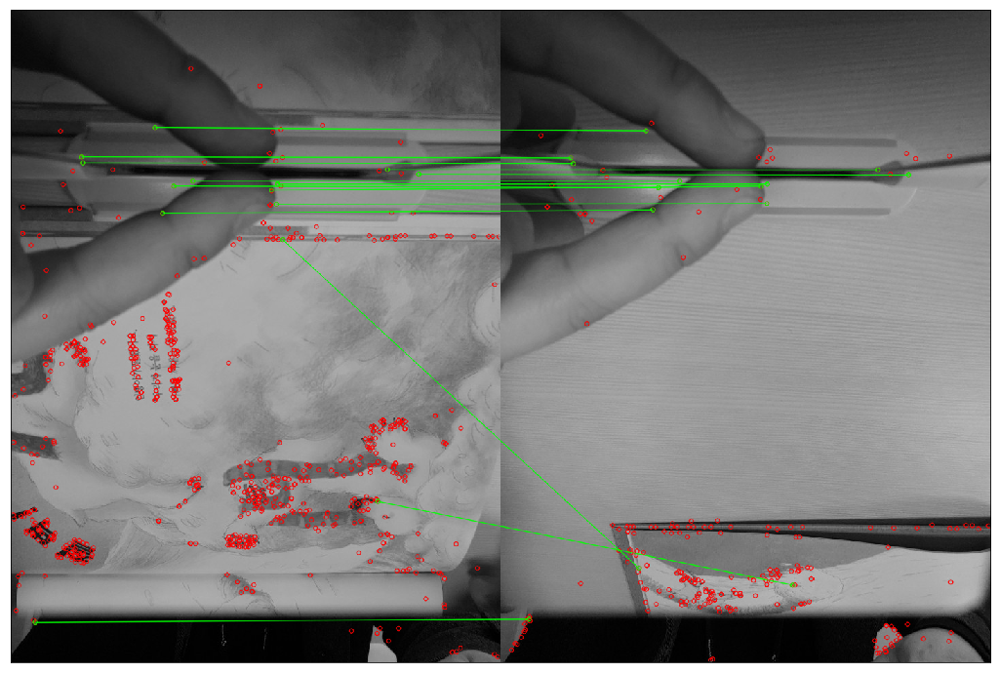

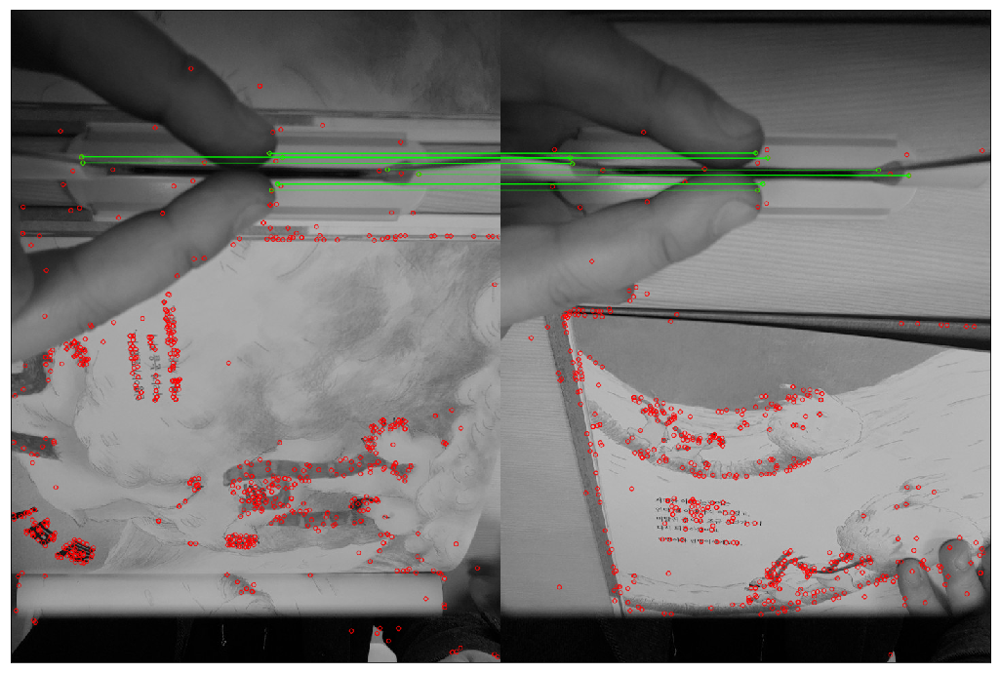

In [17]:
path_dir_1 = "..\\picture\\com_set2"
path_dir_2 = "..\\picture\\com_set3"
file_list_1 = os.listdir(path_dir_1)
file_list_2 = os.listdir(path_dir_2)

for i,j in enumerate(file_list_1):
    if i+1 >= len(file_list_1):
        break
    else: 
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+4]))

(9, <matplotlib.image.AxesImage object at 0x000001A157A390B8>)


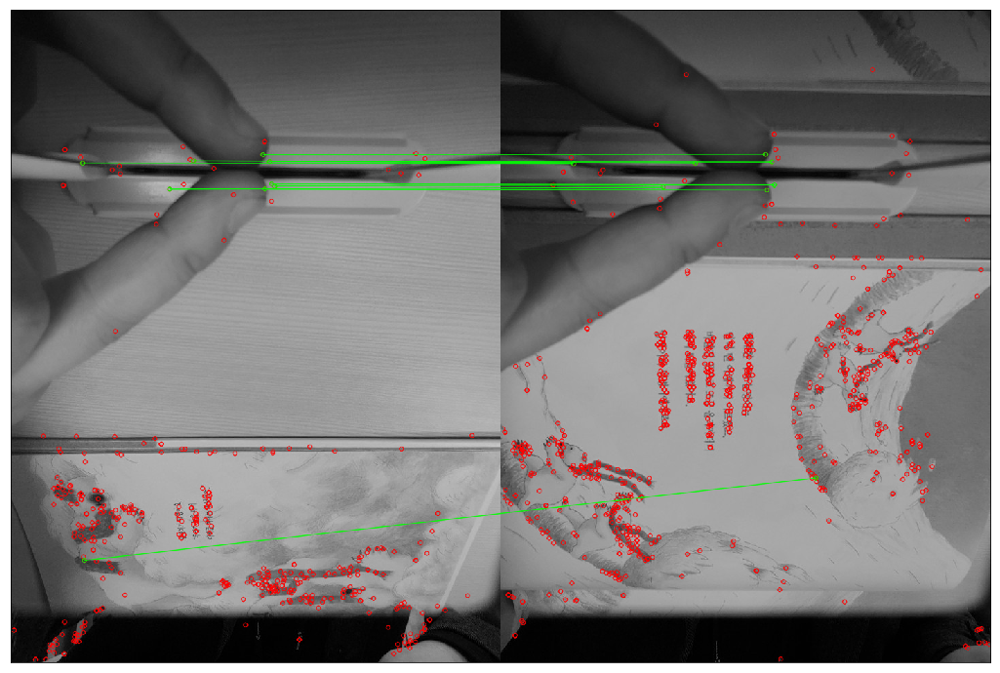

In [10]:
path_dir_1 = "..\\picture\\com_set2"
path_dir_2 = "..\\picture\\com_set3"
file_list_1 = os.listdir(path_dir_1)
file_list_2 = os.listdir(path_dir_2)

for i,j in enumerate(file_list_1):
    if i+1 >= len(file_list_1):
        break
    else: 
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_FLANN(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+4]))

# Feature classification

## scoring 
match_score를 통해 확인
minimum으로 threshold를 정해서 일치 여부 비교 

In [11]:
def match_score(im1,im2, func):
    original = cv.imread(im1,0)
    compare = cv.imread(im2,0)
    if str(func) == 'fm_2' :
        sift = cv.xfeatures2d.SIFT_create()

        kp1, des1 = sift.detectAndCompute(original,None)
        kp2, des2 = sift.detectAndCompute(compare,None)

        bf = cv.BFMatcher()
        matches = bf.knnMatch(des1,des2, k=2)

        good = []
        for m,n in matches:
            if m.distance < 0.75*n.distance:
                good.append([m])
                
        number_keypoints = 0
        if len(kp1) <= len(kp2):
            number_keypoints = len(kp1)
        else :
            number_keypoints = len(kp2)
        
        match_score = (len(good) / number_keypoints) * 100
        
        return match_score

    if str(func) == 'fm_3' :
        sift = cv.xfeatures2d.SIFT_create()

        kp1, des1 = sift.detectAndCompute(original,None)
        kp2, des2 = sift.detectAndCompute(compare,None)

        # FLANN parameters
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        search_params = dict(checks=100)   # or pass empty dictionary
        flann = cv.FlannBasedMatcher(index_params,search_params)
        matches = flann.knnMatch(des1,des2,k=2) # 2순위 매칭 결과까지 취함 

        # Need to draw only good matches, so create a mask
        matchesMask = [[0,0] for i in range(len(matches))]
        good = []

        number_keypoints = 0
        if len(kp1) <= len(kp2):
            number_keypoints = len(kp1)
        else :
            number_keypoints = len(kp2)


        # ratio test as per Lowe's paper
        for i,(m,n) in enumerate(matches):
            if m.distance < 0.68*n.distance:
                matchesMask[i]=[1,0]
                good.append(m)
    
        match_score = (len(good) / number_keypoints) * 100
    
        return match_score

In [12]:
print("score between unsimilar image : %s" %match_score('bear_real.png', 'no_bear.png', 'fm_2'),
      "score between scene image and real : %s" %match_score('bear_real.png', 'bear_in_scene.png', 'fm_3'),
      "score between same image : %s" %match_score('bear_real.png',"bear_real.png", "fm_3"), sep = "\n")

score between unsimilar image : 1.4066496163682864
score between scene image and real : 7.161125319693094
score between same image : 100.0


In [13]:
path_dir = "..\\picture\\com_set2"
file_list = os.listdir(path_dir)

for i,j in enumerate(file_list):
    if i+1 >= len(file_list):
        break
    else: 
        match_score(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1],fm_2)